Importing libraries and preprocessing dataset

In [53]:
import pandas as pd
import matplotlib.pyplot as plt
import scipy.stats as stats
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.cluster import DBSCAN
from sklearn.decomposition import PCA
import plotly.express as px
from scipy.stats import chi2_contingency
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from keras.models import Sequential
from keras.layers import Dense

In [3]:
churn_data = pd.read_excel(r'C:\Users\seema\OneDrive - Navrachana University\SunbaseData 18-oct\customer_churn_large_dataset.xlsx')
churn_data.head()

,CustomerID,Name,Age,Gender,Location,Subscription_Length_Months,Monthly_Bill,Total_Usage_GB,Churn
0,1,Customer_1,63,Male,Los Angeles,17,73.36,236,0
1,2,Customer_2,62,Female,New York,1,48.76,172,0
2,3,Customer_3,24,Female,Los Angeles,5,85.47,460,0
3,4,Customer_4,36,Female,Miami,3,97.94,297,1
4,5,Customer_5,46,Female,Miami,19,58.14,266,0


In [4]:
churn_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 9 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   CustomerID                  100000 non-null  int64  
 1   Name                        100000 non-null  object 
 2   Age                         100000 non-null  int64  
 3   Gender                      100000 non-null  object 
 4   Location                    100000 non-null  object 
 5   Subscription_Length_Months  100000 non-null  int64  
 6   Monthly_Bill                100000 non-null  float64
 7   Total_Usage_GB              100000 non-null  int64  
 8   Churn                       100000 non-null  int64  
dtypes: float64(1), int64(5), object(3)
memory usage: 6.9+ MB


In [5]:
churn_data[['Name', 'Location']].nunique()

Name        100000
Location         5
dtype: int64

In [6]:
churn_data = churn_data.drop(columns=['Name'])

In [7]:
churn_data.describe()

,CustomerID,Age,Subscription_Length_Months,Monthly_Bill,Total_Usage_GB,Churn
count,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000
mean,50000.500000,44.027020,12.490100,65.053197,274.393650,0.497790
std,28867.657797,15.280283,6.926461,20.230696,130.463063,0.499998
min,1.000000,18.000000,1.000000,30.000000,50.000000,0.000000
25%,25000.750000,31.000000,6.000000,47.540000,161.000000,0.000000
50%,50000.500000,44.000000,12.000000,65.010000,274.000000,0.000000
75%,75000.250000,57.000000,19.000000,82.640000,387.000000,1.000000
max,100000.000000,70.000000,24.000000,100.000000,500.000000,1.000000


No missing values (if we encounter in future, KNN or RF imputation could be used for numerical columns and mode imputation for categories). No class imbalance problem too (Churn mean). No skewness or anomalies detected as of now. Let us check their distributions and outliers or any anomalies. Also let us divide the data based on churn to see differences in the two categories that could be fed to the model. 


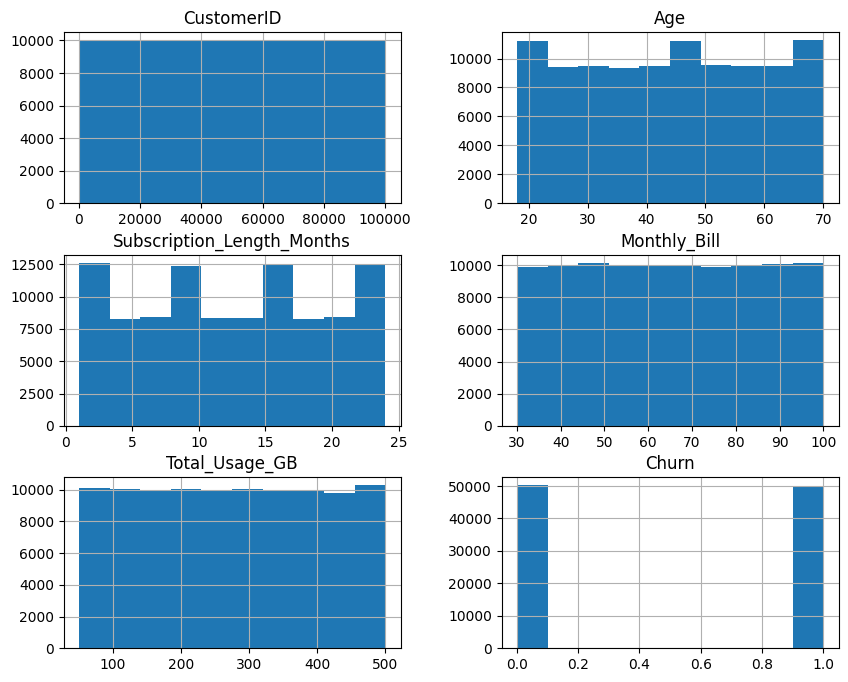

In [8]:
churn_data.hist(figsize=(10, 8))
plt.show()

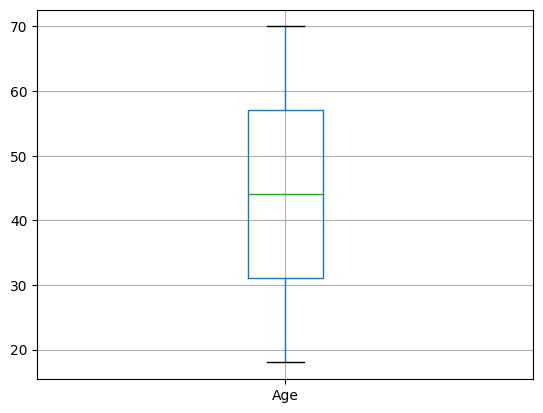

In [12]:
churn_data[['Age']].boxplot()
plt.show()

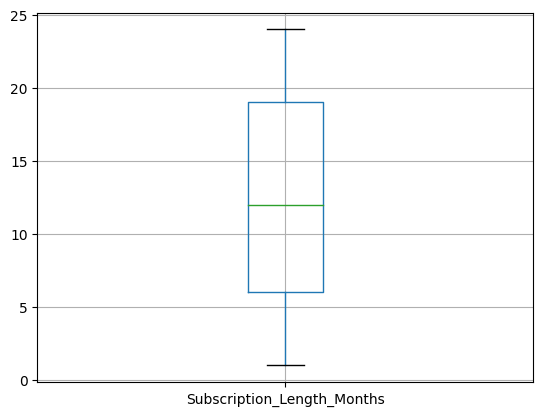

In [13]:
churn_data[['Subscription_Length_Months']].boxplot()
plt.show()

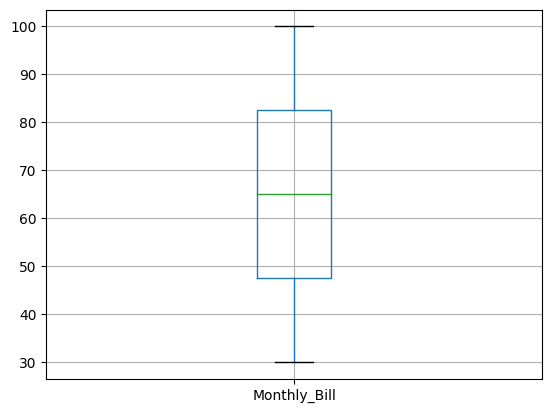

In [14]:
churn_data[['Monthly_Bill']].boxplot()
plt.show()

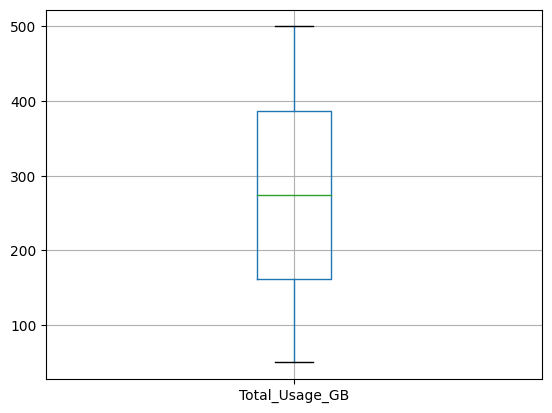

In [15]:
churn_data[['Total_Usage_GB']].boxplot()
plt.show()

Distribution is uniform and no skewness is observed

In [16]:
correlation_matrix = churn_data.corr()
correlation_matrix

,CustomerID,Age,Subscription_Length_Months,Monthly_Bill,Total_Usage_GB,Churn
CustomerID,1.000000,-0.001085,0.005444,0.001265,-0.004025,-0.004586
Age,-0.001085,1.000000,0.003382,0.001110,0.001927,0.001559
Subscription_Length_Months,0.005444,0.003382,1.000000,-0.005294,-0.002203,0.002328
Monthly_Bill,0.001265,0.001110,-0.005294,1.000000,0.003187,-0.000211
Total_Usage_GB,-0.004025,0.001927,-0.002203,0.003187,1.000000,-0.002842
Churn,-0.004586,0.001559,0.002328,-0.000211,-0.002842,1.000000


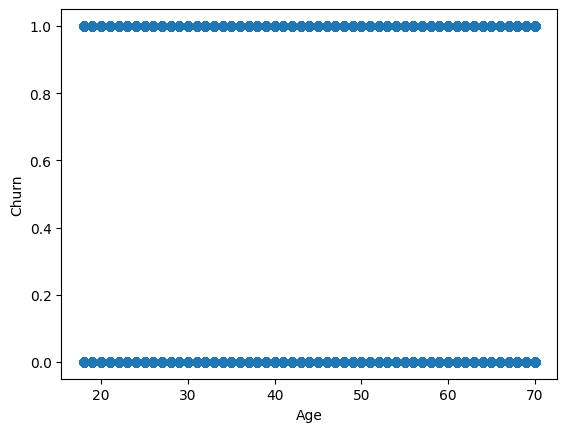

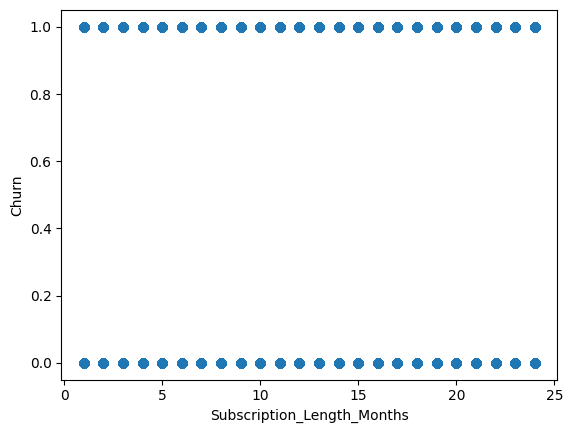

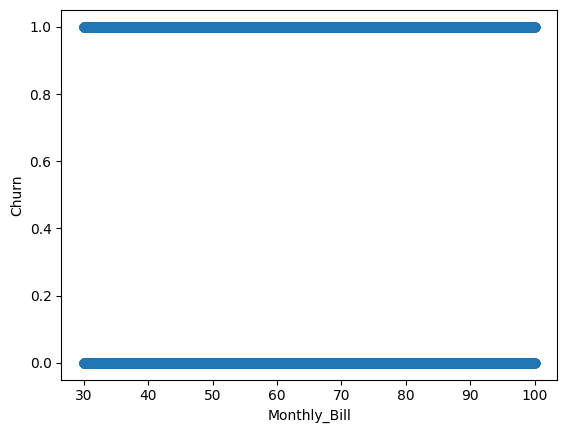

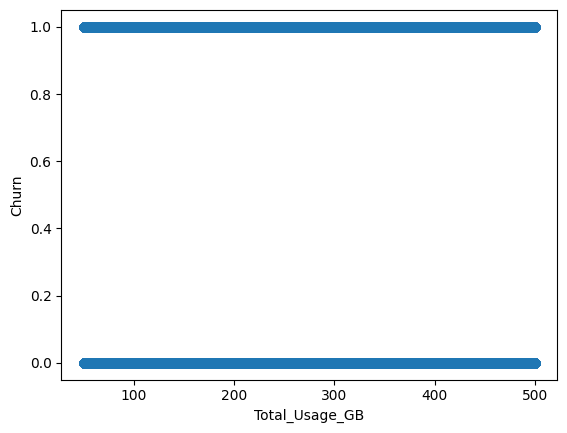

In [18]:
numerical_columns = ['Age', 'Subscription_Length_Months', 'Monthly_Bill', 'Total_Usage_GB']
for i in range(len(numerical_columns)):
    col1 = numerical_columns[i]
    plt.scatter(churn_data[col1], churn_data['Churn'])
    plt.xlabel(col1)
    plt.ylabel('Churn')
    plt.show()

Null Hypothesis (H0): There is no significant difference in the means of the numerical column between the two groups (churn = 0 and churn = 1).

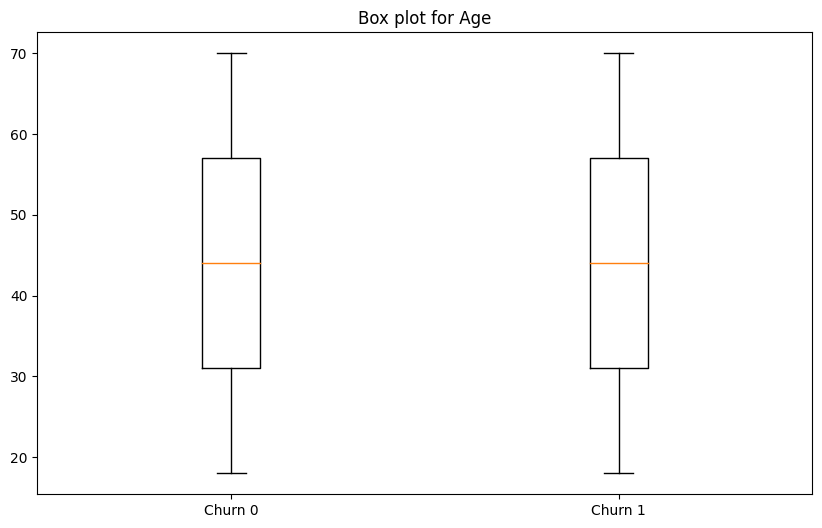

Test for Age:
T-test statistic: -0.49294962401030196
p-value: 0.6220492649740325
The p-value is greater than or equal to 0.05, so we fail to reject the null hypothesis.




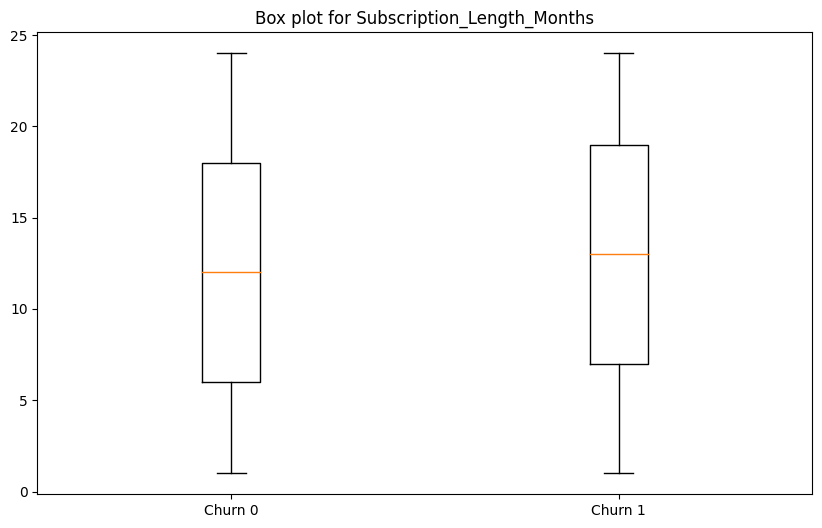

Test for Subscription_Length_Months:
T-test statistic: -0.736249526578786
p-value: 0.4615805837995207
The p-value is greater than or equal to 0.05, so we fail to reject the null hypothesis.




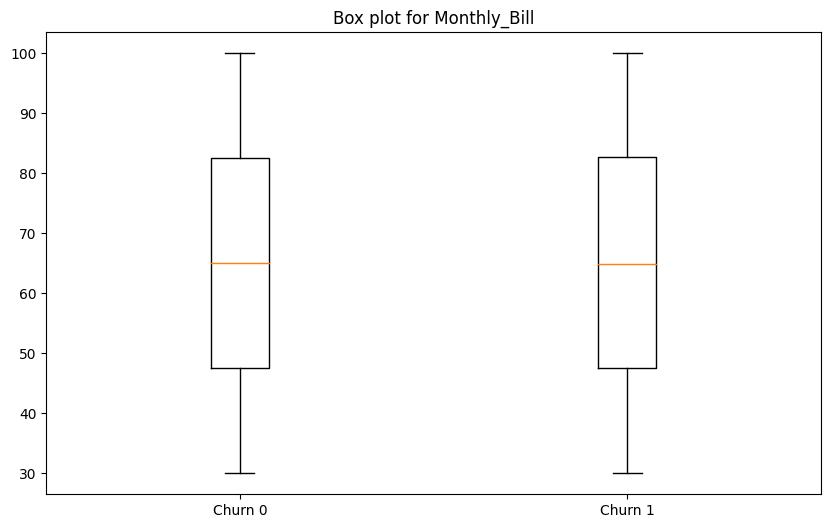

Test for Monthly_Bill:
T-test statistic: 0.06681806081646441
p-value: 0.9467266786704482
The p-value is greater than or equal to 0.05, so we fail to reject the null hypothesis.




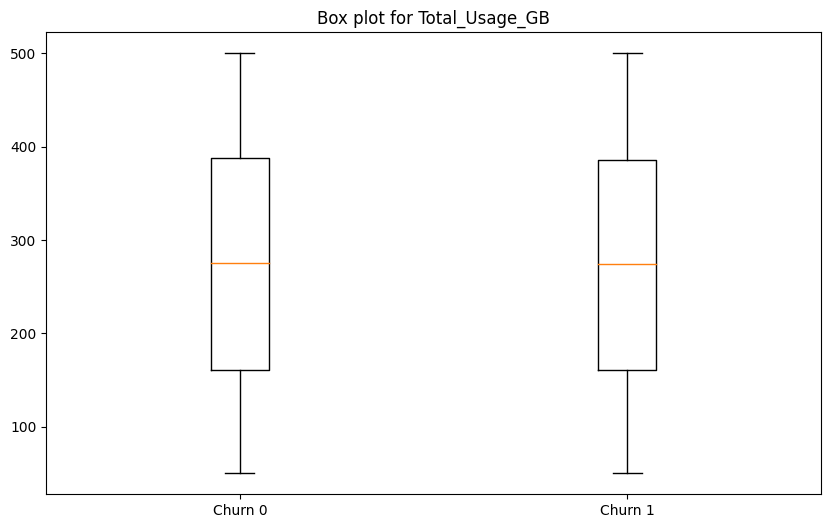

Test for Total_Usage_GB:
T-test statistic: 0.8985673507755924
p-value: 0.36888531937756586
The p-value is greater than or equal to 0.05, so we fail to reject the null hypothesis.




In [19]:
for column in numerical_columns:
    churn_0 = churn_data[churn_data['Churn'] == 0][column]
    churn_1 = churn_data[churn_data['Churn'] == 1][column]
    t_stat, p_value = stats.ttest_ind(churn_0, churn_1) # Performing the t-test to checi=k significant difference

    # here will be the box plots for both classes
    plt.figure(figsize=(10, 6))
    plt.boxplot([churn_0, churn_1], labels=['Churn 0', 'Churn 1'])
    plt.title(f'Box plot for {column}')
    plt.show()
    print(f'Test for {column}:')
    print(f'T-test statistic: {t_stat}')
    print(f'p-value: {p_value}')

    if p_value < 0.05:
        print(f'The p-value is less than 0.05, so we reject the null hypothesis.')
    else:
        print(f'The p-value is greater than or equal to 0.05, so we fail to reject the null hypothesis.')

    print('\n' + '='*30 + '\n')

In [32]:
# Null hypothesis for categories: there is no significant association between categories and churn
contingency_gender = pd.crosstab(churn_data['Gender'], churn_data['Churn'])
contingency_location = pd.crosstab(churn_data['Location'], churn_data['Churn'])

# Performing the chi-squared test for categories
chi2_gender, p_gender, dof_gender, expected_gender = chi2_contingency(contingency_gender)
chi2_location, p_location, dof_location, expected_location = chi2_contingency(contingency_location)

print(f'Chi-squared test for Gender:')
print(f'Chi-squared statistic: {chi2_gender}')
print(f'p-value: {p_gender}')
if p_gender < 0.05:
    print(f'The p-value is less than 0.05, so we reject the null hypothesis.')
else:
    print(f'The p-value is greater than or equal to 0.05, so we fail to reject the null hypothesis.')

print('\n' + '='*30 + '\n')

print(f'Chi-squared test for Location:')
print(f'Chi-squared statistic: {chi2_location}')
print(f'p-value: {p_location}')
if p_location < 0.05:
    print(f'The p-value is less than 0.05, so we reject the null hypothesis.')
else:
    print(f'The p-value is greater than or equal to 0.05, so we fail to reject the null hypothesis.')

Chi-squared test for Gender:
Chi-squared statistic: 0.4413972946971719
p-value: 0.5064488106432634
The p-value is greater than or equal to 0.05, so we fail to reject the null hypothesis.


Chi-squared test for Location:
Chi-squared statistic: 10.404170106364795
p-value: 0.03414293762924668
The p-value is less than 0.05, so we reject the null hypothesis.


Only location column has a significant association with Churn, but even association is not always causation, means it is not necessary that one variable causes the other to change. 

Training the model with these column would lead to 50% accuracy or less. Still, To conform, let us convert data into vectors and compress them into 3d to view any outliers (entire row outlier) and also check if the given data can be divided by any decision boundar.

In [20]:
categorical_columns = ['Gender', 'Location']
numerical_transformer = StandardScaler()
categorical_transformer = Pipeline(steps=[
    ('onehot', OneHotEncoder(drop='first'))
])
# Bundle transformers
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_columns),
        ('cat', categorical_transformer, categorical_columns)
    ])

# Applying preprocessing and DBSCAN
dbscan = DBSCAN(eps=0.5, min_samples=2)
pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                           ('clustering', dbscan)])

outliers = pipeline.fit_predict(churn_data)
# Converting the result to a DataFrame for easier analysis
outlier_df = pd.DataFrame({'Outlier': outliers}, index=churn_data.index)

# Applying PCA to reduce the dimensionality for visualization purposes
pca = PCA(n_components=3)
X_all = preprocessor.fit_transform(churn_data)
X_pca = pca.fit_transform(X_all)

# Creating a DataFrame for PCA components and outliers
pca_df = pd.DataFrame(data=X_pca, columns=['PCA1', 'PCA2', 'PCA3'])
pca_df['Outlier'] = outliers

# Visualize the clusters using Plotly
fig = px.scatter_3d(pca_df, x='PCA1', y='PCA2', z='PCA3', color='Outlier')
fig.show()

In [21]:
pd.Series(dbscan.labels_).value_counts()

 9    10160
 2    10090
 3    10090
 5    10036
 1    10002
 7     9997
 0     9950
 8     9941
 6     9922
 4     9811
-1        1
dtype: int64

hence, there is just one row (-1) which is entirely an outlier, what we do with that does not matter since no neural network or SVM would be able to draw a decision boundary through the plotted data.

let us create some new columns, and then analyse their impact in multiple dimensions.

In [24]:
bins = [18, 30, 40, 50, 60, 70]
labels = ['18-30', '31-40', '41-50', '51-60', '61-70']
churn_data['Age_Group'] = pd.cut(churn_data['Age'], bins=bins, labels=labels, right=False)
age_group_churn = churn_data.groupby(['Age_Group', 'Churn']).size().unstack()
age_group_churn['Churn_Rate'] = age_group_churn[1] / (age_group_churn[0] + age_group_churn[1])
age_group_churn
#with this churn rate we will see what the probability of that class is for churning. 

Churn,0,1,Churn_Rate
Age_Group,,,
18-30,11383,11165,0.495166
31-40,9412,9452,0.501060
41-50,9458,9353,0.497209
51-60,9564,9494,0.498164
61-70,9425,9373,0.498617


In [28]:
num_bins = 10
bin_edges = [i for i in range(0, 501, 50)]
churn_data['avg_Usage_Per_Month'] = churn_data['Total_Usage_GB'] / churn_data['Subscription_Length_Months']
churn_data['avg_Usage_Per_Month_Bin'] = pd.cut(churn_data['avg_Usage_Per_Month'], bins=bin_edges)
usage_churn_rates = churn_data.groupby(['avg_Usage_Per_Month_Bin', 'Churn']).size().unstack()
usage_churn_rates['Churn_Rate'] = usage_churn_rates[1] / (usage_churn_rates[0] + usage_churn_rates[1])
print(usage_churn_rates)

Churn                        0      1  Churn_Rate
avg_Usage_Per_Month_Bin                          
(0, 50]                  39682  39417    0.498325
(50, 100]                 5890   5707    0.492110
(100, 150]                1838   1872    0.504582
(150, 200]                 950    918    0.491435
(200, 250]                 696    682    0.494920
(250, 300]                 252    264    0.511628
(300, 350]                 239    253    0.514228
(350, 400]                 232    201    0.464203
(400, 450]                 196    241    0.551487
(450, 500]                 246    224    0.476596


In [29]:
bins = [0, 0.25, 0.5, 0.75, 1, 1.25, 1.5]
churn_data['Bill_Per_GB'] = churn_data['Monthly_Bill'] / churn_data['Total_Usage_GB']
churn_data['Bill_Per_GB_Bin'] = pd.cut(churn_data['Bill_Per_GB'], bins)
bill_gb_bin_churn = churn_data.groupby(['Bill_Per_GB_Bin', 'Churn']).size().unstack()
bill_gb_bin_churn['Churn_Rate'] = bill_gb_bin_churn[1] / (bill_gb_bin_churn[0] + bill_gb_bin_churn[1])
print(bill_gb_bin_churn)

Churn                0      1  Churn_Rate
Bill_Per_GB_Bin                          
(0.0, 0.25]      26628  26346    0.497338
(0.25, 0.5]      14644  14417    0.496094
(0.5, 0.75]       4799   4773    0.498642
(0.75, 1.0]       2147   2161    0.501625
(1.0, 1.25]       1099   1141    0.509375
(1.25, 1.5]        572    572    0.500000


In [66]:
num_bins = 10  
bin_range = (0, 2500)  
churn_data['Bill_Subscription_Product'] = churn_data['Monthly_Bill'] * churn_data['Subscription_Length_Months']
churn_data['Bill_Subscription_Product_Bin'] = pd.cut(churn_data['Bill_Subscription_Product'], bins=num_bins, include_lowest=True)
bill_product_churn_rates = churn_data.groupby(['Bill_Subscription_Product_Bin','Churn']).size().unstack()
bill_product_churn_rates['Churn_Rate'] = bill_product_churn_rates[1] / (bill_product_churn_rates[0] + bill_product_churn_rates[1])
print(bill_product_churn_rates)

Churn                             0     1  Churn_Rate
Bill_Subscription_Product_Bin                        
(27.689999999999998, 267.006]  8548  8477    0.497915
(267.006, 503.952]             8682  8439    0.492903
(503.952, 740.898]             8396  8417    0.500625
(740.898, 977.844]             7427  7364    0.497870
(977.844, 1214.79]             5704  5827    0.505333
(1214.79, 1451.736]            4433  4204    0.486743
(1451.736, 1688.682]           3107  3148    0.503277
(1688.682, 1925.628]           2063  2139    0.509043
(1925.628, 2162.574]           1340  1270    0.486590
(2162.574, 2399.52]             521   494    0.486700


The churn rates do vary but the difference is not that significant. Let us combine previous categories and also these new columns as categories and see it's effect on churn rate. 
If churn rates vary among classes of this grouped data it would be possible for the model to catch some patterns and predict churn.

By grouping data we are changing unit of analysis from raw (each row was a single customer) to aggregated combinations where getting significant variations is possible. These variations could be fed to the model and it would catch patterns on an aggregated level for prediction.

In [34]:
combined_groups2 = churn_data.groupby(['Age_Group', 'Location', 'Gender', 'Bill_Per_GB_Bin','avg_Usage_Per_Month_Bin','Bill_Subscription_Product_Bin'])['Churn'].mean().reset_index()
combined_groups2 = combined_groups2.rename(columns={'Churn': 'Churn_Rate'})
#taking mean of churn for each combination since it is same as the formula 1/(0+1) for this context as churn is binary.

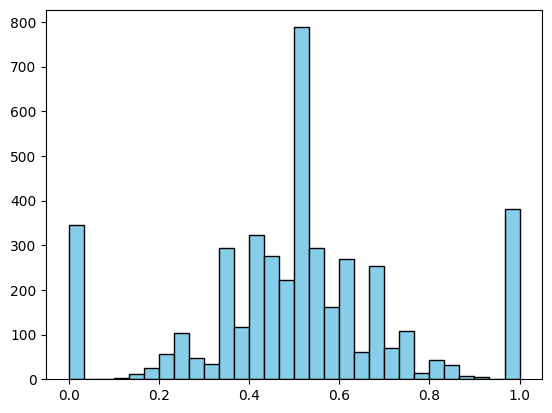

In [36]:
plt.hist(combined_groups2['Churn_Rate'], bins=30, color='skyblue', edgecolor='black')
plt.show()

So now we see that churn rates vary from 0 to 1. 
We intrepret this in a way that there are combinations of these categories where the mean churn is 1 so in future if a customer comes from that particular group which historically has a record of customers churning, it is likely that the new customer will churn.

Based on this interpretation, we can input these categories after one-hot-encoding them, and hoping the model learns these patterns

In [48]:
selected_columns = ['Age_Group', 'Location', 'Gender', 'Bill_Per_GB_Bin', 'avg_Usage_Per_Month_Bin', 'Bill_Subscription_Product_Bin']

df_selected = churn_data[selected_columns]
encoder = OneHotEncoder(sparse=False)
df_encoded = encoder.fit_transform(df_selected)
df_encoded = pd.DataFrame(df_encoded , columns=encoder.get_feature_names_out(selected_columns))
df_encoded['Churn'] = churn_data['Churn']
df_small = df_encoded.sample(frac=0.1, random_state=42)
X = df_small.drop('Churn', axis=1)
y = df_small['Churn']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
models = {
    'Random Forest': RandomForestClassifier(),
    'Logistic Regression': LogisticRegression(),
    'Support Vector Machine': SVC(),
    'Neural Network': MLPClassifier(max_iter=500)
}
for model_name, model in models.items():
    model.fit(X_train, y_train)
    accuracy = model.score(X_test, y_test)
    print(f'{model_name} Accuracy: {accuracy}')

Random Forest Accuracy: 0.4785
Logistic Regression Accuracy: 0.4995
Support Vector Machine Accuracy: 0.4925
Neural Network Accuracy: 0.4875


Logistic regression has performed well so let us check it's accuracy on whole data instead of 10%, also let us try replacing multi layered perceptron with feed forward neural network using two activation functions, ReLU in first layers then sigmoid or gaussian at last as they give output in range = [0,1] and we need output in [0,1] too.

In [51]:
x1 = df_encoded.drop('Churn', axis=1)
y1 = df_encoded['Churn']
X_train1, X_test1, y_train1, y_test1 = train_test_split(x1, y1, test_size=0.2, random_state=42)
model1 = LogisticRegression()
model1.fit(X_train1, y_train1)
accuracy1 = model1.score(X_test1, y_test1)
accuracy1

0.4998

In [54]:
fnn_model = Sequential([
    Dense(64, activation='relu', input_shape=(X_train.shape[1],)),
    Dense(32, activation='relu'),
    Dense(1, activation='sigmoid')
])

fnn_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
fnn_model.fit(X_train1, y_train1, epochs=10, batch_size=32, validation_data=(X_test1, y_test1))

Epoch 1/10
2500/2500 [==============================] - 6s 2ms/step - loss: 0.6944 - accuracy: 0.5006 - val_loss: 0.6932 - val_accuracy: 0.5025
Epoch 2/10
2500/2500 [==============================] - 5s 2ms/step - loss: 0.6930 - accuracy: 0.5089 - val_loss: 0.6934 - val_accuracy: 0.5031
Epoch 3/10
2500/2500 [==============================] - 5s 2ms/step - loss: 0.6927 - accuracy: 0.5103 - val_loss: 0.6938 - val_accuracy: 0.5022
Epoch 4/10
2500/2500 [==============================] - 5s 2ms/step - loss: 0.6925 - accuracy: 0.5141 - val_loss: 0.6937 - val_accuracy: 0.4994
Epoch 5/10
2500/2500 [==============================] - 5s 2ms/step - loss: 0.6918 - accuracy: 0.5192 - val_loss: 0.6944 - val_accuracy: 0.5088
Epoch 6/10
2500/2500 [==============================] - 5s 2ms/step - loss: 0.6915 - accuracy: 0.5192 - val_loss: 0.6954 - val_accuracy: 0.5017
Epoch 7/10
2500/2500 [==============================] - 5s 2ms/step - loss: 0.6909 - accuracy: 0.5240 - val_loss: 0.6958 - val_accuracy:

53% accuracy sounds better than other <50% let us continue with neural networks (feed forward) with differnt activation functions, loss measures and optimizer

In [58]:
fnn_model1 = Sequential([
    Dense(64, activation='relu', input_shape=(X_train.shape[1],)),
    Dense(32, activation='relu'),
    Dense(1, activation='sigmoid')
])

fnn_model1.compile(optimizer='SGD', loss='binary_crossentropy', metrics=['accuracy'])
fnn_model1.fit(X_train1, y_train1, epochs=10, batch_size=32, validation_data=(X_test1, y_test1))

Epoch 1/10
2500/2500 [==============================] - 5s 2ms/step - loss: 0.6949 - accuracy: 0.5015 - val_loss: 0.6941 - val_accuracy: 0.4970
Epoch 2/10
2500/2500 [==============================] - 5s 2ms/step - loss: 0.6936 - accuracy: 0.5025 - val_loss: 0.6938 - val_accuracy: 0.4996
Epoch 3/10
2500/2500 [==============================] - 5s 2ms/step - loss: 0.6934 - accuracy: 0.5048 - val_loss: 0.6936 - val_accuracy: 0.5015
Epoch 4/10
2500/2500 [==============================] - 5s 2ms/step - loss: 0.6932 - accuracy: 0.5045 - val_loss: 0.6937 - val_accuracy: 0.4979
Epoch 5/10
2500/2500 [==============================] - 5s 2ms/step - loss: 0.6931 - accuracy: 0.5078 - val_loss: 0.6937 - val_accuracy: 0.4983
Epoch 6/10
2500/2500 [==============================] - 5s 2ms/step - loss: 0.6930 - accuracy: 0.5094 - val_loss: 0.6936 - val_accuracy: 0.5013
Epoch 7/10
2500/2500 [==============================] - 5s 2ms/step - loss: 0.6929 - accuracy: 0.5105 - val_loss: 0.6936 - val_accuracy:

stochastic gradient descent compared to adam optimizer converges slower and mean squared error assumes this is regression and does not penalize for misclassifications too.

In [62]:
fnn_model2 = Sequential([
    Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    Dense(64, activation='relu'),
    Dense(32, activation='relu'),
    Dense(16, activation='relu'),
    Dense(1, activation='sigmoid')
])

fnn_model2.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
fnn_model2.fit(X_train1, y_train1, epochs=15, batch_size=32, validation_data=(X_test1, y_test1))

Epoch 1/15
2500/2500 [==============================] - 9s 2ms/step - loss: 0.6936 - accuracy: 0.5006 - val_loss: 0.6931 - val_accuracy: 0.5052
Epoch 2/15
2500/2500 [==============================] - 6s 2ms/step - loss: 0.6933 - accuracy: 0.5002 - val_loss: 0.6931 - val_accuracy: 0.5012
Epoch 3/15
2500/2500 [==============================] - 6s 2ms/step - loss: 0.6932 - accuracy: 0.5015 - val_loss: 0.6932 - val_accuracy: 0.5064
Epoch 4/15
2500/2500 [==============================] - 6s 3ms/step - loss: 0.6932 - accuracy: 0.5035 - val_loss: 0.6932 - val_accuracy: 0.4997
Epoch 5/15
2500/2500 [==============================] - 6s 3ms/step - loss: 0.6930 - accuracy: 0.5080 - val_loss: 0.6930 - val_accuracy: 0.5091
Epoch 6/15
2500/2500 [==============================] - 6s 2ms/step - loss: 0.6928 - accuracy: 0.5118 - val_loss: 0.6931 - val_accuracy: 0.5042
Epoch 7/15
2500/2500 [==============================] - 6s 2ms/step - loss: 0.6927 - accuracy: 0.5101 - val_loss: 0.6934 - val_accuracy:

the model is still almost performing at chance level (probably because data is randomly generated)
and it is not overfitting given that training and validation metrics are close. 
we shall move forward with fnn_model2 now. 

In [64]:
from sklearn.metrics import classification_report, confusion_matrix
y_pred = fnn_model2.predict(X_test1)
y_pred = (y_pred > 0.5)  
classification_rep = classification_report(y_test1, y_pred)
confusion_mat = confusion_matrix(y_test1, y_pred)
print(classification_rep)
print(confusion_mat)

 63/625 [==>...........................] - ETA: 2s

625/625 [==============================] - 2s 3ms/step
              precision    recall  f1-score   support

           0       0.51      0.40      0.45     10079
           1       0.50      0.60      0.55      9921

    accuracy                           0.50     20000
   macro avg       0.50      0.50      0.50     20000
weighted avg       0.50      0.50      0.50     20000

[[4077 6002]
 [3935 5986]]


In [75]:
import pickle
with open('my_churn_prediction_model.pkl', 'wb') as file:
    pickle.dump(fnn_model2, file)

In [76]:
import pickle
with open('onehot_encoder.pkl', 'wb') as file:
    pickle.dump(encoder, file)